#Business problem

We are already known about dangerous wildfires occurred in USA, Australia, India and many more countries. In 2019, we have seen the destructive Amazon forest wildfires whose effect has seen in lot of countries as cloud of smoke, breathing issues etc. We have heard of Uttarakhand wildfire and recently Mizoram forests are burning for continuous 30 hours which has a spread to nearby towns and human settlements. Although there is fire detection systems are in place working but it didn’t go far enough that it predicts the wildfires before they ever start and which could prevent from destruction and losses or at least provide an early alarm to mitigate the effect. We know that there are combinations of factor that leads to a wildfire and we will try to use those factors not all because of unavailability of data at one place and try to predict as far as possible to prevent wildfires.
To achieve our task we are going to use Kaggle 1.88 Million Wildfires data that occurred in the United States from 1992 to 2015. This data has been collected by federal, state and local organization. The total wildfires data says that it has burned around 140 million acres of land during the span of 24-year. We will use this data to model and predict the outcomes. By using better modelling technique and its output we can try to inform local authority to both stop people or thing using in this area and also be prepared during the time of natural phenomenon like lighting. Once we have successfully achieved a good amount of predictability percentage we will try to simulate this technique on some other wildfire data.


#ML formulation 

There are thirteen different classes or cause of fire marked for each data point and we have to pick features wisely which will help us predict those causes accurately => Multi class classification problem


#Business constraints
•	Probability/percentage of a data-point belonging to each class is needed.

•	No low-latency requirement.


#Performance metric 

•	Multi class log-loss

•	Confusion Matrix



In [ ]:
import pandas as pd
import numpy as np
import sqlite3
import matplotlib.pyplot as plt
import folium
from folium import plugins
from folium.plugins import HeatMap
%matplotlib inline
import matplotlib
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
conn = sqlite3.connect("/content//drive/MyDrive/FPA_FOD_20170508.sqlite")

In [ ]:
df = pd.read_sql_query("SELECT * FROM Fires;", conn)
df.columns

Index(['OBJECTID', 'FOD_ID', 'FPA_ID', 'SOURCE_SYSTEM_TYPE', 'SOURCE_SYSTEM',
       'NWCG_REPORTING_AGENCY', 'NWCG_REPORTING_UNIT_ID',
       'NWCG_REPORTING_UNIT_NAME', 'SOURCE_REPORTING_UNIT',
       'SOURCE_REPORTING_UNIT_NAME', 'LOCAL_FIRE_REPORT_ID',
       'LOCAL_INCIDENT_ID', 'FIRE_CODE', 'FIRE_NAME',
       'ICS_209_INCIDENT_NUMBER', 'ICS_209_NAME', 'MTBS_ID', 'MTBS_FIRE_NAME',
       'COMPLEX_NAME', 'FIRE_YEAR', 'DISCOVERY_DATE', 'DISCOVERY_DOY',
       'DISCOVERY_TIME', 'STAT_CAUSE_CODE', 'STAT_CAUSE_DESCR', 'CONT_DATE',
       'CONT_DOY', 'CONT_TIME', 'FIRE_SIZE', 'FIRE_SIZE_CLASS', 'LATITUDE',
       'LONGITUDE', 'OWNER_CODE', 'OWNER_DESCR', 'STATE', 'COUNTY',
       'FIPS_CODE', 'FIPS_NAME', 'Shape'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1880465 entries, 0 to 1880464
Data columns (total 39 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   OBJECTID                    int64  
 1   FOD_ID                      int64  
 2   FPA_ID                      object 
 3   SOURCE_SYSTEM_TYPE          object 
 4   SOURCE_SYSTEM               object 
 5   NWCG_REPORTING_AGENCY       object 
 6   NWCG_REPORTING_UNIT_ID      object 
 7   NWCG_REPORTING_UNIT_NAME    object 
 8   SOURCE_REPORTING_UNIT       object 
 9   SOURCE_REPORTING_UNIT_NAME  object 
 10  LOCAL_FIRE_REPORT_ID        object 
 11  LOCAL_INCIDENT_ID           object 
 12  FIRE_CODE                   object 
 13  FIRE_NAME                   object 
 14  ICS_209_INCIDENT_NUMBER     object 
 15  ICS_209_NAME                object 
 16  MTBS_ID                     object 
 17  MTBS_FIRE_NAME              object 
 18  COMPLEX_NAME                object 
 19  FIRE_YEAR            

In [ ]:
df.head()

,OBJECTID,FOD_ID,FPA_ID,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,SOURCE_REPORTING_UNIT,SOURCE_REPORTING_UNIT_NAME,LOCAL_FIRE_REPORT_ID,LOCAL_INCIDENT_ID,FIRE_CODE,FIRE_NAME,ICS_209_INCIDENT_NUMBER,ICS_209_NAME,MTBS_ID,MTBS_FIRE_NAME,COMPLEX_NAME,FIRE_YEAR,DISCOVERY_DATE,DISCOVERY_DOY,DISCOVERY_TIME,STAT_CAUSE_CODE,STAT_CAUSE_DESCR,CONT_DATE,CONT_DOY,CONT_TIME,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,OWNER_CODE,OWNER_DESCR,STATE,COUNTY,FIPS_CODE,FIPS_NAME,Shape
0,1,1,FS-1418826,FED,FS-FIRESTAT,FS,USCAPNF,Plumas National Forest,0511,Plumas National Forest,1,PNF-47,BJ8K,FOUNTAIN,None,None,None,None,None,2005,2453403.5,33,1300,9.0,Miscellaneous,2453403.5,33.0,1730,0.10,A,40.036944,-121.005833,5.0,USFS,CA,63,063,Plumas,b'\x00\x01\xad\x10\x00\x00\xe8d\xc2\x92_@^\xc0...
1,2,2,FS-1418827,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,0503,Eldorado National Forest,13,13,AAC0,PIGEON,None,None,None,None,None,2004,2453137.5,133,0845,1.0,Lightning,2453137.5,133.0,1530,0.25,A,38.933056,-120.404444,5.0,USFS,CA,61,061,Placer,b'\x00\x01\xad\x10\x00\x00T\xb6\xeej\xe2\x19^\...
2,3,3,FS-1418835,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,0503,Eldorado National Forest,27,021,A32W,SLACK,None,None,None,None,None,2004,2453156.5,152,1921,5.0,Debris Burning,2453156.5,152.0,2024,0.10,A,38.984167,-120.735556,13.0,STATE OR PRIVATE,CA,17,017,El Dorado,b'\x00\x01\xad\x10\x00\x00\xd0\xa5\xa0W\x13/^\...
3,4,4,FS-1418845,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,0503,Eldorado National Forest,43,6,None,DEER,None,None,None,None,None,2004,2453184.5,180,1600,1.0,Lightning,2453189.5,185.0,1400,0.10,A,38.559167,-119.913333,5.0,USFS,CA,3,003,Alpine,b'\x00\x01\xad\x10\x00\x00\x94\xac\xa3\rt\xfa]...
4,5,5,FS-1418847,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,0503,Eldorado National Forest,44,7,None,STEVENOT,None,None,None,None,None,2004,2453184.5,180,1600,1.0,Lightning,2453189.5,185.0,1200,0.10,A,38.559167,-119.933056,5.0,USFS,CA,3,003,Alpine,b'\x00\x01\xad\x10\x00\x00@\xe3\xaa.\xb7\xfb]\...


In [ ]:
df = pd.read_sql_query("Select LATITUDE, LONGITUDE,DISCOVERY_DATE, DISCOVERY_DOY, STAT_CAUSE_DESCR, FIRE_SIZE, FIRE_YEAR FROM Fires;", conn)
df['STAT_CAUSE_DESCR'].value_counts()

Debris Burning       429028
Miscellaneous        323805
Arson                281455
Lightning            278468
Missing/Undefined    166723
Equipment Use        147612
Campfire              76139
Children              61167
Smoking               52869
Railroad              33455
Powerline             14448
Fireworks             11500
Structure              3796
Name: STAT_CAUSE_DESCR, dtype: int64

In [ ]:
df = pd.read_sql_query("Select LATITUDE, LONGITUDE,DISCOVERY_DATE, DISCOVERY_DOY, STAT_CAUSE_CODE, FIRE_SIZE, FIRE_YEAR FROM Fires;", conn)
df['STAT_CAUSE_CODE'].value_counts()


5.0     429028
9.0     323805
7.0     281455
1.0     278468
13.0    166723
2.0     147612
4.0      76139
8.0      61167
3.0      52869
6.0      33455
11.0     14448
10.0     11500
12.0      3796
Name: STAT_CAUSE_CODE, dtype: int64

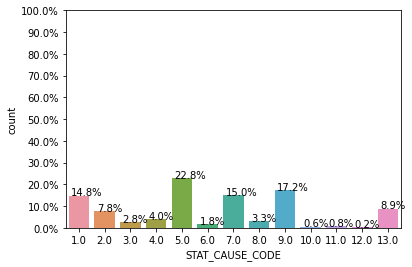

In [ ]:
total = len(y)*1.
ax=sns.countplot(x=y, data=df)
for p in ax.patches:
        ax.annotate('{:.1f}%'.format(100*p.get_height()/total), (p.get_x()+0.1, p.get_height()+5))

#put 11 ticks (therefore 10 steps), from 0 to the total number of rows in the dataframe
ax.yaxis.set_ticks(np.linspace(0, total, 11))

#adjust the ticklabel to the desired format, without changing the position of the ticks. 
ax.set_yticklabels(map('{:.1f}%'.format, 100*ax.yaxis.get_majorticklocs()/total))
plt.show()

By looking onto the plot we can see the cause code 5.0(Debris Burning) has a greater percentage followed by 9.0(Miscellaneous) and 7.0(Arson) are major causes of wildfire.

By looking on all the available columns we have choosen the feature which is relevant for our experiment and which will help us to predict the accurate cause as closely as possible.

In [ ]:
df = pd.read_sql_query("Select LATITUDE, LONGITUDE,DISCOVERY_DATE, DISCOVERY_DOY, STAT_CAUSE_CODE, FIRE_SIZE,STATE, STAT_CAUSE_DESCR,FIRE_YEAR FROM Fires;", conn)
df.sort_values(by=['LATITUDE'], inplace=True)
df 

,LATITUDE,LONGITUDE,DISCOVERY_DATE,DISCOVERY_DOY,STAT_CAUSE_CODE,FIRE_SIZE,STATE,STAT_CAUSE_DESCR,FIRE_YEAR
371301,17.939722,-67.190210,2453804.5,69,9.0,35.0,PR,Miscellaneous,2006
1728849,17.944924,-67.180858,2456827.5,170,7.0,0.8,PR,Arson,2014
369719,17.950000,-67.116667,2453418.5,48,9.0,151.0,PR,Miscellaneous,2005
1728720,17.951389,-67.195556,2456741.5,84,13.0,2.2,PR,Missing/Undefined,2014
1728974,17.951940,-67.212500,2456890.5,233,7.0,0.1,PR,Arson,2014
...,...,...,...,...,...,...,...,...,...
210635,69.782800,-158.369900,2449171.5,184,1.0,16740.0,AK,Lightning,1993
210704,69.849500,-159.219900,2449190.5,203,1.0,82370.0,AK,Lightning,1993
1571473,70.137800,-151.123600,2456097.5,171,1.0,216.0,AK,Lightning,2012
1571470,70.138100,-150.628100,2456097.5,171,1.0,2311.0,AK,Lightning,2012


# Removing Outlier of Latitude and Longitude Column using Box Plot

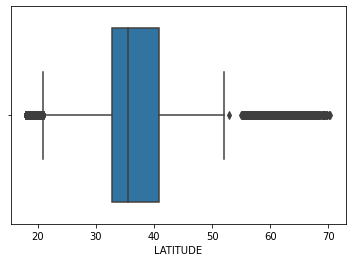

In [ ]:
import seaborn as sns
sns.boxplot(x=df['LATITUDE'])

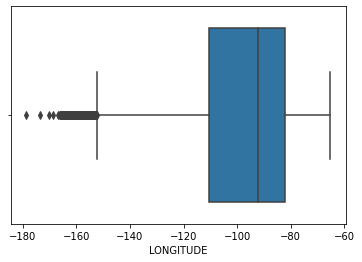

In [ ]:
import seaborn as sns
sns.boxplot(x=df['LONGITUDE'])

In [ ]:
print("Min Number of Outlier in Latitude",np.count_nonzero(np.where(df['LATITUDE']<25)))
print("Max Number of Outlier in Latitude",np.count_nonzero(np.where(df['LATITUDE']>52)))
print("Min Number of Outlier in Longitude",np.count_nonzero(np.where(df['LONGITUDE']<-150)))

Min Number of Outlier in Latitude 32261
Max Number of Outlier in Latitude 12842
Min Number of Outlier in Longitude 14335


In [ ]:
min_LATITUDE=(np.where(df['LATITUDE']<25)[0].tolist())
max_LATITUDE=(np.where(df['LATITUDE']>52)[0].tolist())


In [ ]:
df.drop(max_LATITUDE,inplace = True)
df.drop(min_LATITUDE,inplace = True)
df.reset_index(inplace = True)
min_LONGITUDE=(np.where(df['LONGITUDE']<-150)[0].tolist())
df.drop(min_LONGITUDE,inplace = True)
df=df.drop(['index'], axis=1)
df

,LATITUDE,LONGITUDE,DISCOVERY_DATE,DISCOVERY_DOY,STAT_CAUSE_CODE,FIRE_SIZE,STATE,STAT_CAUSE_DESCR,FIRE_YEAR
0,17.939722,-67.190210,2453804.5,69,9.0,35.0,PR,Miscellaneous,2006
1,17.944924,-67.180858,2456827.5,170,7.0,0.8,PR,Arson,2014
2,17.950000,-67.116667,2453418.5,48,9.0,151.0,PR,Miscellaneous,2005
3,17.951389,-67.195556,2456741.5,84,13.0,2.2,PR,Missing/Undefined,2014
4,17.951940,-67.212500,2456890.5,233,7.0,0.1,PR,Arson,2014
...,...,...,...,...,...,...,...,...,...
1835331,68.983100,-145.352800,2451780.5,237,2.0,0.1,AK,Equipment Use,2000
1835332,69.026300,-149.563700,2452073.5,164,1.0,844.7,AK,Lightning,2001
1835353,69.468100,-148.333600,2454350.5,250,1.0,1630.7,AK,Lightning,2007
1835355,69.777450,-147.145350,2454655.5,190,1.0,40.0,AK,Lightning,2008


In [ ]:
from math import radians, cos, sin, asin, sqrt
def distance(lat1, lat2, lon1, lon2):
     
    # The math module contains a function named
    # radians which converts from degrees to radians.
    lon1 = radians(lon1)
    lon2 = radians(lon2)
    lat1 = radians(lat1)
    lat2 = radians(lat2)
      
    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
 
    c = 2 * asin(sqrt(a))
    
    # Radius of earth in kilometers. Use 3956 for miles
    r = 6371
      
    # calculate the result
    return(c * r)
     



In [ ]:
counter=[]
for i in range(len(df)) :
  count=0
  for j in range(25000): 
    
    #print(df.iloc[i, 0], df.iloc[i, 2])
    #print(df.iloc[j+1, 0], df.iloc[j+1, 2])
    #print(distance(df.iloc[i, 0], df.iloc[i, 2], df.iloc[j+1, 0], df.iloc[j+1, 2]), "K.M") 
    dist=distance(df.iloc[i, 0], df.iloc[i, 2], df.iloc[j, 0], df.iloc[j, 2])
    #print(dist)
    if dist<=12000:
      count+=1
  df['countper1000KM']=count
  counter.append(count)

df.to_csv("/content/drive/MyDrive/file2.csv")
import numpy as np
data = np.array(counter)
np.savez("/content/drive/MyDrive/Myfile", data)

In [ ]:
df['DATE'] = pd.to_datetime(df['DISCOVERY_DATE'] - pd.Timestamp(0).to_julian_date(), unit='D')
df['MONTH'] = pd.DatetimeIndex(df['DATE']).month
df['DAY_OF_WEEK'] = df['DATE'].dt.day_name()
df

,LATITUDE,LONGITUDE,DISCOVERY_DATE,DISCOVERY_DOY,STAT_CAUSE_CODE,FIRE_SIZE,STATE,STAT_CAUSE_DESCR,FIRE_YEAR,DATE,MONTH,DAY_OF_WEEK
0,17.939722,-67.190210,2453804.5,69,9.0,35.0,PR,Miscellaneous,2006,2006-03-10,3,Friday
1,17.944924,-67.180858,2456827.5,170,7.0,0.8,PR,Arson,2014,2014-06-19,6,Thursday
2,17.950000,-67.116667,2453418.5,48,9.0,151.0,PR,Miscellaneous,2005,2005-02-17,2,Thursday
3,17.951389,-67.195556,2456741.5,84,13.0,2.2,PR,Missing/Undefined,2014,2014-03-25,3,Tuesday
4,17.951940,-67.212500,2456890.5,233,7.0,0.1,PR,Arson,2014,2014-08-21,8,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...
1835331,68.983100,-145.352800,2451780.5,237,2.0,0.1,AK,Equipment Use,2000,2000-08-24,8,Thursday
1835332,69.026300,-149.563700,2452073.5,164,1.0,844.7,AK,Lightning,2001,2001-06-13,6,Wednesday
1835353,69.468100,-148.333600,2454350.5,250,1.0,1630.7,AK,Lightning,2007,2007-09-07,9,Friday
1835355,69.777450,-147.145350,2454655.5,190,1.0,40.0,AK,Lightning,2008,2008-07-08,7,Tuesday


In [ ]:
#df['grouped_multiple'] = df.groupby(['STATE', 'STAT_CAUSE_DESCR','MONTH']).size()
#f.head()
df = df.merge(pd.DataFrame({'FirePerMonth':df.groupby(['STATE', 'STAT_CAUSE_DESCR','MONTH']).size()}), left_on=['STATE', 'STAT_CAUSE_DESCR','MONTH'], right_index=True)
df

,LATITUDE,LONGITUDE,DISCOVERY_DATE,DISCOVERY_DOY,STAT_CAUSE_CODE,FIRE_SIZE,STATE,STAT_CAUSE_DESCR,FIRE_YEAR,DATE,MONTH,DAY_OF_WEEK,FirePerMonth
0,17.939722,-67.190210,2453804.5,69,9.0,35.0,PR,Miscellaneous,2006,2006-03-10,3,Friday,38
598,17.966667,-67.190000,2455623.5,62,9.0,1.5,PR,Miscellaneous,2011,2011-03-03,3,Thursday,38
600,17.967100,-67.204000,2452712.5,73,9.0,25.3,PR,Miscellaneous,2003,2003-03-14,3,Friday,38
817,17.970278,-67.179444,2455622.5,61,9.0,3.0,PR,Miscellaneous,2011,2011-03-02,3,Wednesday,38
1671,17.972500,-67.176667,2454166.5,66,9.0,10.0,PR,Miscellaneous,2007,2007-03-07,3,Wednesday,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1832410,64.850000,-147.850000,2454716.5,251,10.0,0.1,AK,Fireworks,2008,2008-09-07,9,Sunday,1
1832657,64.882390,-147.342000,2451097.5,284,3.0,1.0,AK,Smoking,1998,1998-10-11,10,Sunday,1
1832751,64.888720,-147.224800,2451850.5,307,12.0,0.1,AK,Structure,2000,2000-11-02,11,Thursday,1
1833197,65.026900,-141.249200,2456365.5,73,1.0,26.8,AK,Lightning,2013,2013-03-14,3,Thursday,1


In [ ]:
duplicate = df[df.duplicated()]
  
print("Duplicate Rows :")
  
# Print the resultant Dataframe
duplicate

Duplicate Rows :


,LATITUDE,LONGITUDE,DISCOVERY_DATE,DISCOVERY_DOY,STAT_CAUSE_CODE,FIRE_SIZE,STATE,STAT_CAUSE_DESCR,FIRE_YEAR,DATE,MONTH,DAY_OF_WEEK,FirePerMonth
71,17.956533,-66.121941,2454902.5,71,13.0,3.0,PR,Missing/Undefined,2009,2009-03-12,3,Thursday,7192
128,17.956533,-66.121941,2452709.5,70,13.0,2.0,PR,Missing/Undefined,2003,2003-03-11,3,Tuesday,7192
132,17.956533,-66.121941,2453434.5,64,13.0,1.0,PR,Missing/Undefined,2005,2005-03-05,3,Saturday,7192
166,17.956533,-66.121941,2452709.5,70,13.0,1.0,PR,Missing/Undefined,2003,2003-03-11,3,Tuesday,7192
387,17.958364,-66.172852,2454173.5,73,13.0,2.0,PR,Missing/Undefined,2007,2007-03-14,3,Wednesday,7192
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1825032,61.016666,-149.699996,2449195.5,208,9.0,0.1,AK,Miscellaneous,1993,1993-07-27,7,Tuesday,166
1824231,60.475833,-149.472222,2453182.5,178,4.0,0.1,AK,Campfire,2004,2004-06-26,6,Saturday,255
1831744,64.800003,-147.416671,2449836.5,119,5.0,0.1,AK,Debris Burning,1995,1995-04-29,4,Saturday,311
1828484,62.550000,-141.830000,2457198.5,176,1.0,0.1,AK,Lightning,2015,2015-06-25,6,Thursday,741


In [ ]:
df.isnull().sum().sum()

0

In [ ]:
df.isna().sum()

LATITUDE            0
LONGITUDE           0
DISCOVERY_DATE      0
DISCOVERY_DOY       0
STAT_CAUSE_CODE     0
FIRE_SIZE           0
STATE               0
STAT_CAUSE_DESCR    0
FIRE_YEAR           0
DATE                0
MONTH               0
DAY_OF_WEEK         0
FirePerMonth        0
dtype: int64

Fires: Table including wildfire data for the period of 1992-2015 compiled from US federal, state, and local reporting systems.

FIRE_SIZE = Estimate of acres within the final perimeter of the fire.

LATITUDE = Latitude (NAD83) for point location of the fire (decimal degrees).

LONGITUDE = Longitude (NAD83) for point location of the fire (decimal degrees).

STATE = Two-letter alphabetic code for the state in which the fire burned (or originated), based on the nominal designation in the fire report.

FIRE_YEAR = Calendar year in which the fire was discovered or confirmed to exist.

DISCOVERY_DATE = Date on which the fire was discovered or confirmed to exist.

DISCOVERY_DOY = Day of year on which the fire was discovered or confirmed to exist.

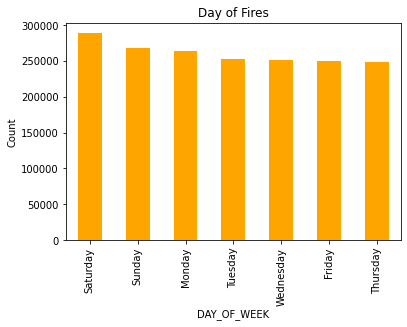

In [ ]:
ax=df['DAY_OF_WEEK'].value_counts().plot(kind='bar',color='orange',title="Day of Fires")
ax.set(xlabel="DAY_OF_WEEK", ylabel="Count")
plt.show()

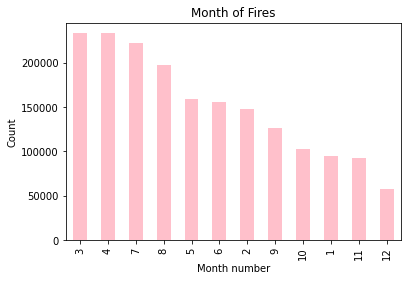

In [ ]:
ax=df['MONTH'].value_counts().plot(kind='bar',color='pink',title="Month of Fires")
ax.set(xlabel="Month number", ylabel="Count")
plt.show()

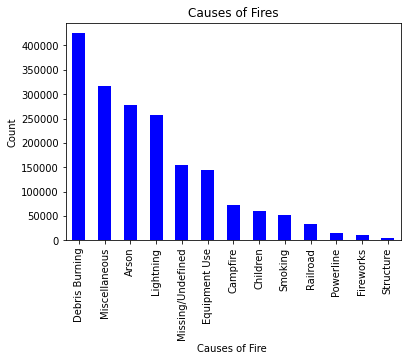

In [ ]:
ax=df['STAT_CAUSE_DESCR'].value_counts().plot(kind='bar',color='blue',title="Causes of Fires")
ax.set(xlabel="Causes of Fire ", ylabel="Count")
plt.show()

The Major source of wildfires according to data is Debris Burning which has caused more than 4 Million wildfires.There could be reason that because of dry leaves or dry waste are cauing wildfires in summer season.

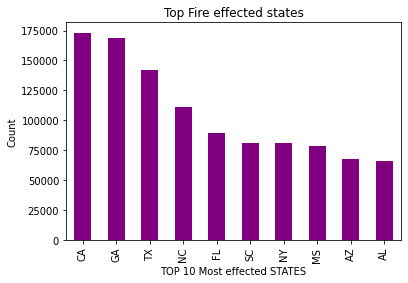

In [ ]:
ax=df['STATE'].value_counts().head(n=10).plot(kind='bar',color='purple',title="Top Fire effected states")
ax.set(xlabel="TOP 10 Most effected STATES", ylabel="Count")
plt.show()

In [ ]:
df_MostEffectedRegion = df[(df.STATE == 'CA') | (df.STATE == 'GA')]

In [ ]:
df_folim = [[row["LATITUDE"],row["LONGITUDE"]] for index, row in df_MostEffectedRegion.iterrows()]

map_ = folium.Map(location=[df["LATITUDE"].mean(), df["LONGITUDE"].mean()],
tiles = "OpenStreetMap",
zoom_start = 3)
# Plot it on the map
HeatMap(df_folim, min_opacity=.4, max_val=.8).add_to(map_)
# Display the map
map_

we have checked the top most affected area for wildfire on which we can focus more to avoid wildfires. We know california is more prone to wildfires and we have seen in the past.

In [ ]:
df_CA = df[df['STATE']=='CA']
df_AL = df[df['STATE']=='AL']

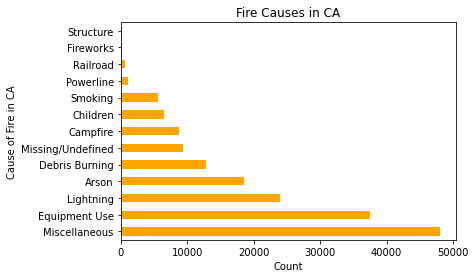

In [ ]:
ax=df_CA['STAT_CAUSE_DESCR'].value_counts().plot(kind='barh',color='orange',title='Fire Causes in CA')
ax.set(xlabel="Count", ylabel="Cause of Fire in CA")
plt.show()

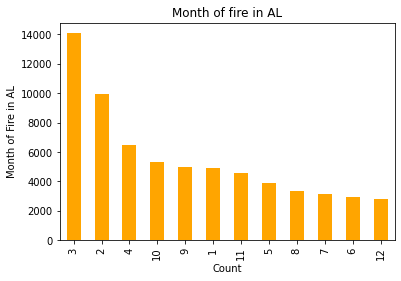

In [ ]:
ax=df_AL['MONTH'].value_counts().plot(kind='bar',color='orange',title='Month of fire in AL')
ax.set(xlabel="Count", ylabel="Month of Fire in AL")
plt.show()

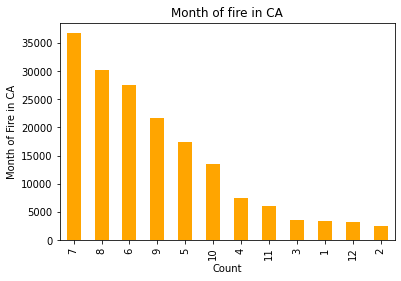

In [ ]:
ax=df_CA['MONTH'].value_counts().plot(kind='bar',color='orange',title='Month of fire in CA')
ax.set(xlabel="Count", ylabel="Month of Fire in CA")
plt.show()

In CA, Miscellaneous has caused major wildfires, around 52 thousand wildfire, we don't have any data about the miscellaneous and what are the factor consist in it.

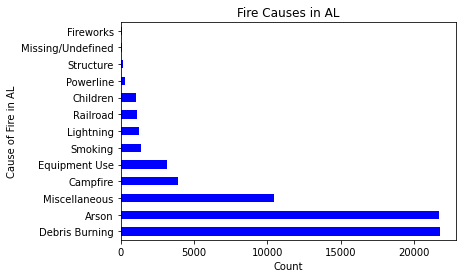

In [ ]:
ax=df_AL['STAT_CAUSE_DESCR'].value_counts().plot(kind='barh',color='blue',title='Fire Causes in AL')
ax.set(xlabel="Count", ylabel="Cause of Fire in AL")
plt.show()

In AL, Debris Burning and Arson has caused major wildfires, around 25 thousand wildfire. we can notice here lighting doesn't caused wildfire in this region.

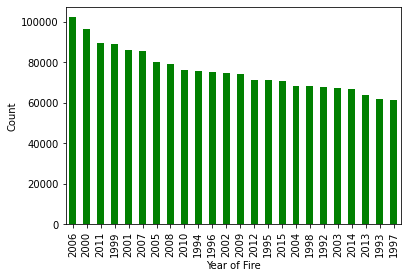

In [ ]:
ax=df['FIRE_YEAR'].value_counts().plot(kind='bar',color='green')
ax.set(xlabel="Year of Fire", ylabel="Count")
plt.show()

In 2006, we have seen the biggest wildfire however there is no any trend seen which will help to keep the checks on upcoming wildfires in the year.

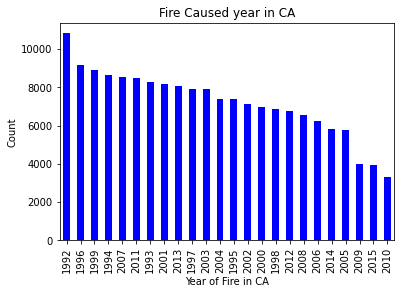

In [ ]:
ax=df_CA['FIRE_YEAR'].value_counts().plot(kind='bar',color='blue',title='Fire Caused year in CA')
ax.set(xlabel="Year of Fire in CA", ylabel="Count")
plt.show()

we have checked the location wise trend of wild fire but we didn't found any trend and it will make more difficult to have prediction of wildfire in coming years.In CA, 1992  has seen the biggest woldfire according to the data and than in 2007.

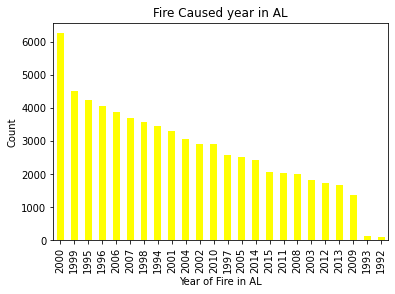

In [ ]:
ax=df_AL['FIRE_YEAR'].value_counts().plot(kind='bar',color='yellow',title='Fire Caused year in AL')
ax.set(xlabel="Year of Fire in AL", ylabel="Count")
plt.show()

according to the data,AL has seen the biggest woldfire in 2000  and than in 1999.

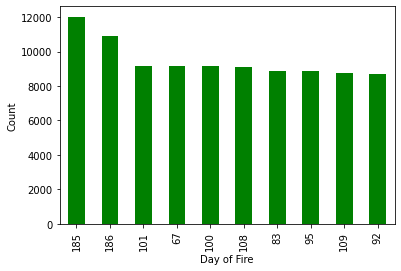

In [ ]:
ax=df['DISCOVERY_DOY'].value_counts().head(10).plot(kind='bar',color='green')
ax.set(xlabel="Day of Fire", ylabel="Count")
plt.show()

According to the data most of the wildfire occured during summer and it has seen almost 15 thousand wildfire.

In [ ]:
#https://stackoverflow.com/questions/40347689/dataframe-describe-suppress-scientific-notation
# percentile list
perc =[.20, .40, .60, .80]
   
# calling describe method
df.describe(percentiles = perc).apply(lambda s: s.apply('{0:.5f}'.format))

,LATITUDE,LONGITUDE,DISCOVERY_DATE,DISCOVERY_DOY,FIRE_SIZE,FIRE_YEAR,MONTH,FirePerMonth
count,1823182.00000,1823182.00000,1823182.00000,1823182.00000,1823182.00000,1823182.00000,1823182.00000,1823182.00000
mean,36.74083,-94.83072,2453022.25891,163.83354,62.30065,2003.59906,5.90076,2960.30413
std,5.93025,15.75844,2449.42999,90.51537,2180.60340,6.70533,2.97044,3474.47881
min,17.93972,-150.00000,2448622.50000,1.00000,0.00001,1992.00000,1.00000,1.00000
20%,32.22278,-112.24203,2450532.50000,76.00000,0.10000,1997.00000,3.00000,414.00000
40%,34.30420,-95.17230,2452160.50000,124.00000,0.50000,2001.00000,5.00000,1081.00000
50%,35.40170,-90.82422,2453087.50000,161.00000,1.00000,2004.00000,6.00000,1594.00000
60%,37.06143,-86.32640,2453854.50000,190.00000,1.10000,2006.00000,7.00000,2254.00000
80%,42.29866,-81.29000,2455547.50000,246.00000,5.00000,2010.00000,9.00000,4968.00000
max,70.33060,-65.25694,2457387.50000,366.00000,558198.30000,2015.00000,12.00000,19230.00000


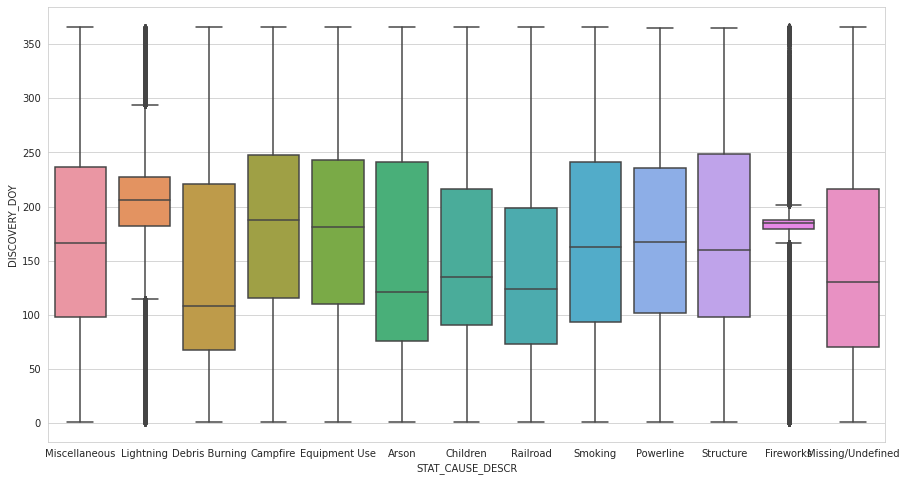

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns

plt.figure(figsize=(15,8))
ax = sns.boxplot(x="STAT_CAUSE_DESCR", y="DISCOVERY_DOY", data=df)

Average wild fires are occurred betweeb April to July which is starting summer season. Most of fire caused in these month which is also a point to be considered though causes are different.

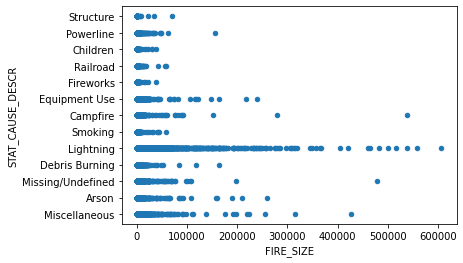

In [ ]:
df.plot(kind='scatter', x='FIRE_SIZE', y='STAT_CAUSE_DESCR') ;
plt.show()


Count of wild fires caused by lighting are more and it is covering large area if occurred other than miscellanoeous





#Correlation between Continuous and Continuous data

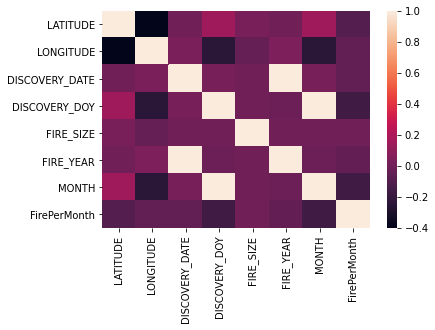

In [ ]:
# Pearson Correlation between the continuos features
corr = df.corr()
sns.heatmap(corr)

#Correlation between Continuous and Categorical data


Point Biserial Correlation Formula


Where:
M0 = the mean of the data from group 0.
M1 = the mean of the data from group 1.
Sy = the standard deviation of the continuous data.
n0 = the number of items in group 0.
n1 = the number of items in group 1.
n = the number of items in both groups together (aka the total rows in the data set).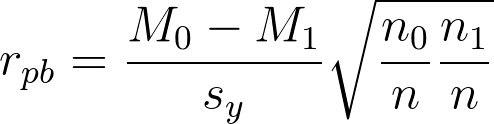

In [ ]:
import scipy.stats as stats

pbc= stats.pointbiserialr(df['LATITUDE'], df['STAT_CAUSE_CODE'])
print("LATITUDE and STAT_CAUSE_Code: ",pbc)

pbc= stats.pointbiserialr(df['LONGITUDE'], df['STAT_CAUSE_CODE'])
print("LONGITUDE and STAT_CAUSE_Code: ",pbc)

pbc= stats.pointbiserialr(df['DISCOVERY_DATE'], df['STAT_CAUSE_CODE'])
print("DISCOVERY_DATE and STAT_CAUSE_Code: ",pbc)

pbc= stats.pointbiserialr(df['FIRE_SIZE'], df['STAT_CAUSE_CODE'])
print("FIRE_SIZE and STAT_CAUSE_Code: ",pbc)

pbc= stats.pointbiserialr(df['FIRE_YEAR'], df['STAT_CAUSE_CODE'])
print("FIRE_YEAR and STAT_CAUSE_Code: ",pbc)

LATITUDE and STAT_CAUSE_Code:  PointbiserialrResult(correlation=-0.1558313671109931, pvalue=0.0)
LONGITUDE and STAT_CAUSE_Code:  PointbiserialrResult(correlation=0.18250087908691728, pvalue=0.0)
DISCOVERY_DATE and STAT_CAUSE_Code:  PointbiserialrResult(correlation=0.052593997214716, pvalue=0.0)
FIRE_SIZE and STAT_CAUSE_Code:  PointbiserialrResult(correlation=-0.02136374527438047, pvalue=1.0543628648697939e-188)
FIRE_YEAR and STAT_CAUSE_Code:  PointbiserialrResult(correlation=0.05715682267267948, pvalue=0.0)


# Correlation Test between Categorical data: Chi Square Test

In [ ]:
contigency= pd.crosstab(df['DAY_OF_WEEK'], y) 
contigency

STAT_CAUSE_CODE,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0
DAY_OF_WEEK,,,,,,,,,,,,,
Friday,40598,20962,7400,8868,58526,4557,38116,7910,44282,1741,1998,531,22617
Monday,39331,22194,7838,11264,62220,5208,40603,8581,46908,1529,2208,540,24017
Saturday,38772,21185,8229,14979,74337,4761,43477,10724,50744,1986,1845,537,26410
Sunday,38306,18200,7944,16157,57903,4279,44998,10654,49692,1753,2003,540,24350
Thursday,40557,21408,7183,7990,57789,4958,37589,7647,43698,1499,2170,556,22841
Tuesday,39522,21881,7196,8755,59662,4989,38421,7980,44916,1381,2009,573,23493
Wednesday,41382,21782,7079,8126,58591,4703,38251,7671,43565,1611,2215,519,22995


chi2: The test statistic

p: The p-value of the test

dof: Degrees of freedom

expected: The expected frequencies, based on the marginal sums of the table

In [ ]:
from scipy.stats import chi2_contingency
c, p, dof, expected = chi2_contingency(contigency) 

print(c, p, dof)

9727.581810122814 0.0 72


In [ ]:
contigency= pd.crosstab(df['STATE'], y) 
contigency

STAT_CAUSE_CODE,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0
STATE,,,,,,,,,,,,,
AK,4108,365,262,1546,2366,12,458,569,1329,158,394,346,930
AL,1320,3144,1388,3931,21785,1110,21826,1022,10503,57,255,154,75
AR,2087,2239,585,436,10136,367,10377,379,4188,9,8,1,851
AZ,28776,2473,2122,6090,4458,381,5341,2551,12919,240,61,49,6125
CA,27000,39407,5936,9516,14318,720,19635,6930,51943,219,1198,123,12605
CO,19945,547,766,2953,708,108,844,208,4660,244,45,16,3113
CT,17,70,187,404,614,46,576,287,2714,0,5,1,55
DC,1,2,7,2,2,0,18,2,31,0,0,0,1
DE,10,14,19,14,18,2,21,1,69,1,0,2,0


In [ ]:
contigency= pd.crosstab(df['MONTH'], y) 
contigency

STAT_CAUSE_CODE,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0
MONTH,,,,,,,,,,,,,
1,604,6840,2726,2504,32816,2518,16411,2978,17803,183,626,166,10263
2,666,8459,3886,3655,52495,3704,28172,4299,21152,117,830,247,21460
3,2369,12050,6044,6108,84379,4807,48580,7894,32858,281,1239,411,28963
4,6046,14433,6908,7800,71234,5151,46964,11835,43738,449,2247,509,18925
5,16684,15234,5347,7919,34890,4862,23877,7000,33521,354,1622,465,12123
6,42997,17185,4299,7265,21519,2685,15006,5122,29958,2274,1449,343,13338
7,90665,19506,5602,10456,19306,2254,17687,6257,39063,6446,1549,349,18094
8,86104,17521,5248,9855,19690,2027,16230,4358,30895,461,1673,307,14209
9,26481,13555,4443,8119,21961,1417,16828,3356,24959,253,1253,254,9186


In [ ]:
c, p, dof, expected = chi2_contingency(contigency) 

print(c, p, dof)

1843469.8981033154 0.0 612


In [ ]:
df=df.drop("STAT_CAUSE_DESCR",axis=1)
y=df['STAT_CAUSE_CODE']
df=df.drop("STAT_CAUSE_CODE",axis=1)
df=df.drop("DISCOVERY_DATE",axis=1)
df=df.drop("DATE",axis=1)
df

,LATITUDE,LONGITUDE,DISCOVERY_DOY,FIRE_SIZE,STATE,FIRE_YEAR,MONTH,DAY_OF_WEEK,FirePerMonth
0,17.939722,-67.190210,69,35.0,PR,2006,3,Friday,38
598,17.966667,-67.190000,62,1.5,PR,2011,3,Thursday,38
600,17.967100,-67.204000,73,25.3,PR,2003,3,Friday,38
817,17.970278,-67.179444,61,3.0,PR,2011,3,Wednesday,38
1671,17.972500,-67.176667,66,10.0,PR,2007,3,Wednesday,38
...,...,...,...,...,...,...,...,...,...
1832410,64.850000,-147.850000,251,0.1,AK,2008,9,Sunday,1
1832657,64.882390,-147.342000,284,1.0,AK,1998,10,Sunday,1
1832751,64.888720,-147.224800,307,0.1,AK,2000,11,Thursday,1
1833197,65.026900,-141.249200,73,26.8,AK,2013,3,Thursday,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df, y,stratify=y,test_size=0.30)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train,stratify=y_train,test_size=0.30)

In [ ]:
print(X_train.shape,X_test.shape,X_cv.shape)

(1166836, 10) (364637, 10) (291709, 10)


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import preprocessing
from sklearn.externals import joblib
classifier=preprocessing.LabelEncoder()


classifier.fit(X_train["STATE"].values)

#joblib.dump(classifier,'/content//drive/MyDrive/LabelEncodeState.pkl')

X_train_state_onehot = classifier.transform(X_train['STATE'].values).reshape(-1,1)
X_test_state_onehot = classifier.transform(X_test['STATE'].values).reshape(-1,1)
X_cv_state_onehot = classifier.transform(X_cv['STATE'].values).reshape(-1,1)
#print(classifier.get_feature_names())
print(classifier.classes_)
print("*"*100)



classifier.fit(X_train["DAY_OF_WEEK"].values)

#joblib.dump(classifier,'/content//drive/MyDrive/LabelEncodeDayofweek.pkl')

X_train_DOW_onehot = classifier.transform(X_train['DAY_OF_WEEK'].values).reshape(-1,1)
X_test_DOW_onehot = classifier.transform(X_test['DAY_OF_WEEK'].values).reshape(-1,1)
X_cv_DOW_onehot = classifier.transform(X_cv['DAY_OF_WEEK'].values).reshape(-1,1)
#print(classifier.get_feature_names())
print(classifier.classes_)
print("*"*100)



# for numerical features 
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train[['LATITUDE','LONGITUDE','DISCOVERY_DOY','FIRE_SIZE','FIRE_YEAR','MONTH','FirePerMonth']].values)

#joblib.dump(normalizer,'/content//drive/MyDrive/NormalizeContinuousVariable.pkl')

X_train_norm = normalizer.transform(X_train[['LATITUDE',	'LONGITUDE','DISCOVERY_DOY','FIRE_SIZE','FIRE_YEAR','MONTH','FirePerMonth']].values)
normalizer.fit(X_test[['LATITUDE','LONGITUDE','DISCOVERY_DOY','FIRE_SIZE','FIRE_YEAR','MONTH','FirePerMonth']].values)
X_test_norm = normalizer.transform(X_test[['LATITUDE',	'LONGITUDE','DISCOVERY_DOY','FIRE_SIZE','FIRE_YEAR','MONTH','FirePerMonth']].values)
normalizer.fit(X_cv[['LATITUDE','LONGITUDE','DISCOVERY_DOY','FIRE_SIZE','FIRE_YEAR','MONTH','FirePerMonth']].values)
X_cv_norm = normalizer.transform(X_cv[['LATITUDE','LONGITUDE','DISCOVERY_DOY','FIRE_SIZE','FIRE_YEAR','MONTH','FirePerMonth']].values)

['AK' 'AL' 'AR' 'AZ' 'CA' 'CO' 'CT' 'DC' 'DE' 'FL' 'GA' 'IA' 'ID' 'IL'
 'IN' 'KS' 'KY' 'LA' 'MA' 'MD' 'ME' 'MI' 'MN' 'MO' 'MS' 'MT' 'NC' 'ND'
 'NE' 'NH' 'NJ' 'NM' 'NV' 'NY' 'OH' 'OK' 'OR' 'PA' 'PR' 'RI' 'SC' 'SD'
 'TN' 'TX' 'UT' 'VA' 'VT' 'WA' 'WI' 'WV' 'WY']
****************************************************************************************************
['Friday' 'Monday' 'Saturday' 'Sunday' 'Thursday' 'Tuesday' 'Wednesday']
****************************************************************************************************


In [ ]:
X_cv_norm.shape

(382869, 7)

In [ ]:
from scipy.sparse import vstack
X_tr = np.hstack((X_train_state_onehot,X_train_DOW_onehot,X_train_norm))
X_te = np.hstack((X_test_state_onehot,X_test_DOW_onehot,X_test_norm))
X_cv = np.hstack((X_cv_state_onehot,X_cv_DOW_onehot,X_cv_norm))

In [ ]:
X_cv[2]

array([ 1.00000000e+01,  3.00000000e+00,  1.83736339e-02, -3.98887285e-02,
        4.99162142e-02,  1.37024902e-02,  9.86089918e-01,  1.95749860e-03,
        1.51706141e-01])

#Random Model

In [ ]:
from sklearn.metrics import log_loss
test_data_len = X_test.shape[0]
cv_data_len = X_cv.shape[0]

cv_predicted_y = np.zeros((cv_data_len,13))
for i in range(cv_data_len):
    rand_probs = np.random.rand(1,13)
    cv_predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Cross Validation Data using Random Model",log_loss(y_cv,cv_predicted_y, eps=1e-15))



test_predicted_y = np.zeros((test_data_len,13))
for i in range(test_data_len):
    rand_probs = np.random.rand(1,13)
    test_predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Test Data using Random Model",log_loss(y_test,test_predicted_y, eps=1e-15))


Log loss on Cross Validation Data using Random Model 2.8570414150558294
Log loss on Test Data using Random Model 2.8600643319274783


In [ ]:
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    print("Number of misclassified points ",(len(test_y)-np.trace(C))/len(test_y)*100)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    
    labels = [1,2,3,4,5,6,7,8,9,10,11,12,13]
    cmap=sns.light_palette("green")
    # representing A in heatmap format
    print("-"*50, "Confusion matrix", "-"*50)
    plt.figure(figsize=(10,5))
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

    print("-"*50, "Precision matrix", "-"*50)
    plt.figure(figsize=(10,5))
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    print("Sum of columns in precision matrix",B.sum(axis=0))
    
    # representing B in heatmap format
    print("-"*50, "Recall matrix"    , "-"*50)
    plt.figure(figsize=(10,5))
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    print("Sum of rows in Recall matrix",A.sum(axis=1))


log_loss for k =  1 is 0.16629982810652005
log_loss for k =  3 is 0.13995499736335076
log_loss for k =  5 is 0.14319515925449172
log_loss for k =  7 is 0.14878857793743092
log_loss for k =  9 is 0.15540849481234437
log_loss for k =  11 is 0.16273487785177485
log_loss for k =  13 is 0.1705878303874478
log_loss for k =  15 is 0.17846771659017194
log_loss for k =  17 is 0.18637148595707664
log_loss for k =  19 is 0.1942694581438268


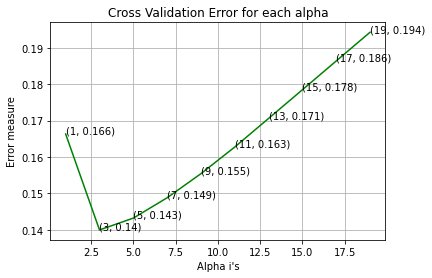

log loss for train data for best Alpha 0.06811820831306598
log loss for cv data for best Alpha 0.13995499736335076
log loss for test data for best Alpha 0.14052896968877152
Number of misclassified points  3.477430979302704
-------------------------------------------------- Confusion matrix --------------------------------------------------


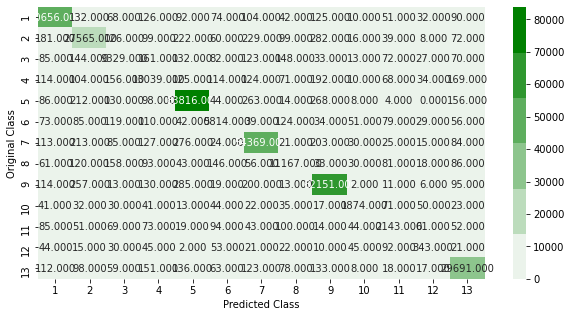

-------------------------------------------------- Precision matrix --------------------------------------------------


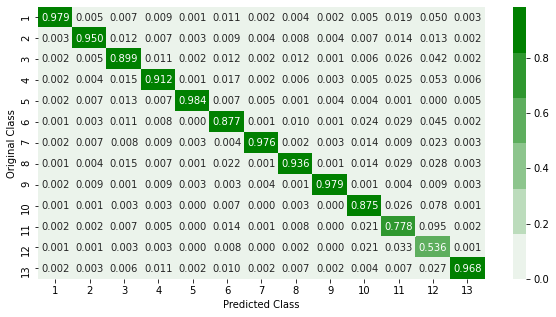

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


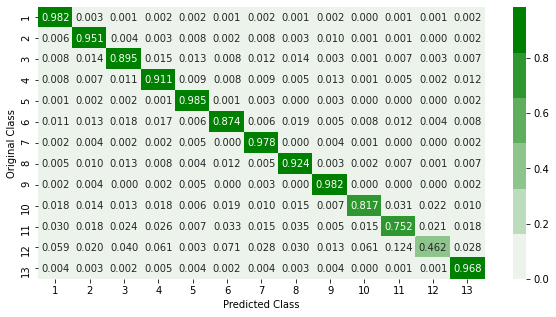

Sum of rows in Recall matrix [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
alpha = [x for x in range(1, 21,2)]
cv_log_error_array=[]
for i in alpha:
    k_cfl=KNeighborsClassifier(n_neighbors=i)
    k_cfl.fit(X_tr,y_train)
    sig_clf = CalibratedClassifierCV(k_cfl, method="sigmoid")
    sig_clf.fit(X_tr, y_train)
    predict_y = sig_clf.predict_proba(X_cv)
    cv_log_error_array.append(log_loss(y_cv, predict_y, labels=k_cfl.classes_, eps=1e-15))
    
for i in range(len(cv_log_error_array)):
    print ('log_loss for k = ',alpha[i],'is',cv_log_error_array[i])

best_alpha = np.argmin(cv_log_error_array)
    
fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


# Best Alpha

k_cfl=KNeighborsClassifier(n_neighbors=alpha[best_alpha])
k_cfl.fit(X_tr,y_train)
sig_clf = CalibratedClassifierCV(k_cfl, method="sigmoid")
sig_clf.fit(X_tr, y_train)



predict_y = sig_clf.predict_proba(X_tr)
print ('log loss for train data for best Alpha',log_loss(y_train, predict_y))
predict_y = sig_clf.predict_proba(X_cv)
print ('log loss for cv data for best Alpha',log_loss(y_cv, predict_y))
predict_y = sig_clf.predict_proba(X_te)
print ('log loss for test data for best Alpha',log_loss(y_test, predict_y))
plot_confusion_matrix(y_test, sig_clf.predict(X_te))

In [ ]:
for i in range(5):
  predicted_cls = sig_clf.predict(X_te[i].reshape(1, -1))
  print("Predicted Class :", predicted_cls[0])
  print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_te[i].reshape(1, -1)),4))
  print("Actual Class :", y_test.iloc[i,])
  print('*'*100)

Predicted Class : 9.0
Predicted Class Probabilities: [[2.200e-03 2.900e-03 2.300e-03 2.600e-03 2.800e-03 1.900e-03 2.500e-03
  1.800e-03 9.755e-01 9.000e-04 1.600e-03 9.000e-04 2.100e-03]]
Actual Class : 9.0
****************************************************************************************************
Predicted Class : 1.0
Predicted Class Probabilities: [[9.752e-01 2.900e-03 2.300e-03 2.600e-03 2.800e-03 1.900e-03 2.500e-03
  1.800e-03 2.500e-03 9.000e-04 1.600e-03 9.000e-04 2.100e-03]]
Actual Class : 1.0
****************************************************************************************************
Predicted Class : 5.0
Predicted Class Probabilities: [[2.200e-03 2.900e-03 2.300e-03 2.600e-03 9.757e-01 1.900e-03 2.500e-03
  1.800e-03 2.500e-03 9.000e-04 1.600e-03 9.000e-04 2.100e-03]]
Actual Class : 5.0
****************************************************************************************************
Predicted Class : 4.0
Predicted Class Probabilities: [[2.200e-03 2.900e-0

In [ ]:
from collections import Counter

predicted_cls = sig_clf.predict(X_te[1].reshape(1,-1))
print("Actual Class :", y_test.iloc[1,])
print("Predicted Class :", predicted_cls[0])

neighbors = k_cfl.kneighbors(X_te[1].reshape(1, -1), alpha[best_alpha])
indx=neighbors[1][0]
print('Nearest Neighbors')
for i in indx:
 print(y_train.iloc[i,])
print('*'*20)

predicted_cls = sig_clf.predict(X_te[8].reshape(1,-1))
print("Actual Class :", y_test.iloc[8,])
print("Predicted Class :", predicted_cls[0])

neighbors = k_cfl.kneighbors(X_te[8].reshape(1, -1), alpha[best_alpha])
indx=neighbors[1][0]
print('Nearest Neighbors')
for i in indx:
 print(y_train.iloc[i,])
print('*'*20)

Actual Class : 1.0
Predicted Class : 1.0
Nearest Neighbors
1.0
1.0
1.0
********************
Actual Class : 4.0
Predicted Class : 5.0
Nearest Neighbors
5.0
3.0
5.0
********************


log_loss for c =  10 is 0.06482057678428195
log_loss for c =  50 is 0.0480868953263707


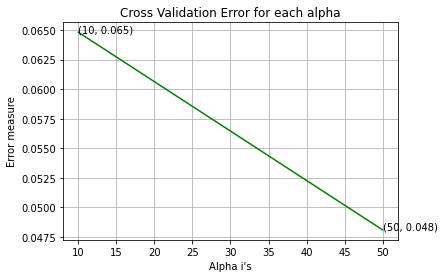

For values of best alpha =  50 The train log loss is: 0.011481332577731635
For values of best alpha =  50 The cross validation log loss is: 0.0480868953263707
For values of best alpha =  50 The test log loss is: 0.047857606064177334
Number of misclassified points  1.1699306433521557
-------------------------------------------------- Confusion matrix --------------------------------------------------


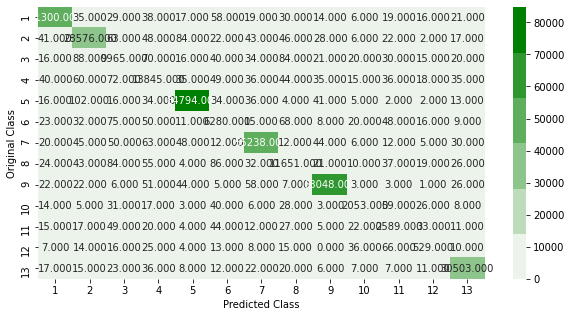

-------------------------------------------------- Precision matrix --------------------------------------------------


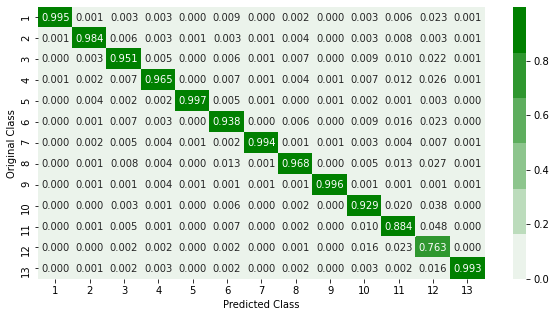

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


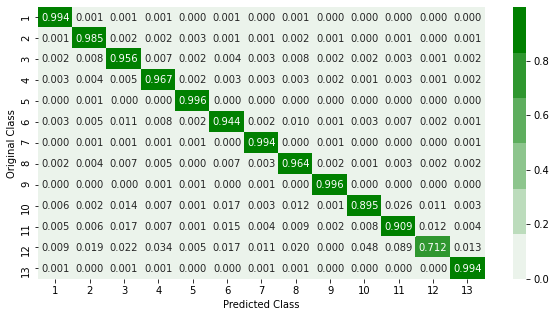

Sum of rows in Recall matrix [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
# There are still many Hyper parameter which we can tune like 'max depth' of tree
alpha=[10,50]
cv_log_error_array=[]
train_log_error_array=[]
from sklearn.ensemble import RandomForestClassifier
for i in alpha:
    r_cfl=RandomForestClassifier(n_estimators=i,random_state=42,n_jobs=-1)
    r_cfl.fit(X_tr,y_train)
    sig_clf = CalibratedClassifierCV(r_cfl, method="sigmoid")
    sig_clf.fit(X_tr, y_train)
    predict_y = sig_clf.predict_proba(X_cv)
    cv_log_error_array.append(log_loss(y_cv, predict_y, labels=r_cfl.classes_, eps=1e-15))

for i in range(len(cv_log_error_array)):
    print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])


best_alpha = np.argmin(cv_log_error_array)

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

r_cfl=RandomForestClassifier(n_estimators=50,random_state=42,n_jobs=-1)
r_cfl.fit(X_tr,y_train)
sig_clf = CalibratedClassifierCV(r_cfl, method="sigmoid")
sig_clf.fit(X_tr, y_train)

predict_y = sig_clf.predict_proba(X_tr)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y))
predict_y = sig_clf.predict_proba(X_cv)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y))
predict_y = sig_clf.predict_proba(X_te)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y))
plot_confusion_matrix(y_test, sig_clf.predict(X_te))

In [ ]:
r_cfl=RandomForestClassifier(n_estimators=50,random_state=42,n_jobs=-1)
r_cfl.fit(X_tr,y_train)
sig_clf = CalibratedClassifierCV(r_cfl, method="sigmoid")
sig_clf.fit(X_tr, y_train)

joblib.dump(sig_clf, '/content//drive/MyDrive/model_1.pkl')


['/content//drive/MyDrive/model_1.pkl']

In [ ]:
#https://towardsdatascience.com/the-power-of-pickletools-handling-large-model-pickle-files-7f9037b9086b
import gzip, pickle, pickletools
filepath ='/content//drive/MyDrive/random_forest_2.pkl'
with gzip.open(filepath, "wb") as f:
    pickled = pickle.dumps(sig_clf)
    optimized_pickle = pickletools.optimize(pickled)
    f.write(optimized_pickle)

In [ ]:
for i in range(5):
  print(X_te[i])
  predicted_cls = sig_clf.predict(X_te[i].reshape(1, -1))
  print("Predicted Class :", predicted_cls[0])
  print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_te[i].reshape(1, -1)),4))
  print("Actual Class :", y_test.iloc[i,])
  print('*'*100)

[ 4.00000000e+00  2.00000000e+00  1.81152000e-02 -5.74172272e-02
  1.52247116e-01  4.68452666e-04  9.38779142e-01  5.15297933e-03
  3.03088875e-01]
Predicted Class : 7.0
Predicted Class Probabilities: [[6.000e-04 6.000e-04 4.000e-04 5.000e-04 6.000e-04 5.000e-04 9.943e-01
  4.000e-04 5.000e-04 3.000e-04 4.000e-04 3.000e-04 6.000e-04]]
Actual Class : 7.0
****************************************************************************************************
[ 9.00000000e+00  3.00000000e+00  1.32623283e-02 -3.78976978e-02
  7.65044614e-02  1.16622655e-02  9.29715803e-01  2.79894371e-03
  3.57798304e-01]
Predicted Class : 6.0
Predicted Class Probabilities: [[6.000e-04 6.000e-04 4.000e-04 5.000e-04 6.000e-04 9.942e-01 5.000e-04
  4.000e-04 5.000e-04 3.000e-04 4.000e-04 3.000e-04 6.000e-04]]
Actual Class : 6.0
****************************************************************************************************
[ 4.00000000e+00  5.00000000e+00  1.57972145e-02 -5.61963397e-02
  6.82822434e-02  2.4

log_loss for c =  10 is 1.4564889410158814
log_loss for c =  50 is 1.2175218219308541
log_loss for c =  100 is 1.05559791823838
log_loss for c =  500 is 0.5335320010769917


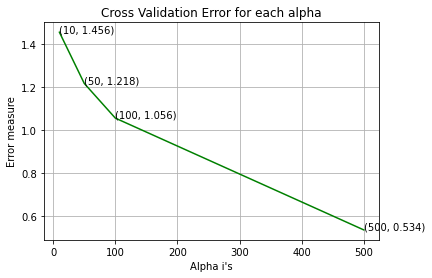

In [ ]:

alpha=[10,50,100,500]
cv_log_error_array=[]
for i in alpha:
    x_cfl=XGBClassifier(n_estimators=i,nthread=-1)
    x_cfl.fit(X_tr,y_train)
    sig_clf = CalibratedClassifierCV(x_cfl, method="sigmoid")
    sig_clf.fit(X_tr, y_train)
    predict_y = sig_clf.predict_proba(X_cv)
    cv_log_error_array.append(log_loss(y_cv, predict_y, labels=x_cfl.classes_, eps=1e-15))

for i in range(len(cv_log_error_array)):
    print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])


best_alpha = np.argmin(cv_log_error_array)

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()



For values of best alpha =  100 The train log loss is: 1.0505517425966666
For values of best alpha =  100 The cross validation log loss is: 1.0540831211993043
For values of best alpha =  100 The test log loss is: 1.0539778342421589
Number of misclassified points  36.65563286227124
-------------------------------------------------- Confusion matrix --------------------------------------------------


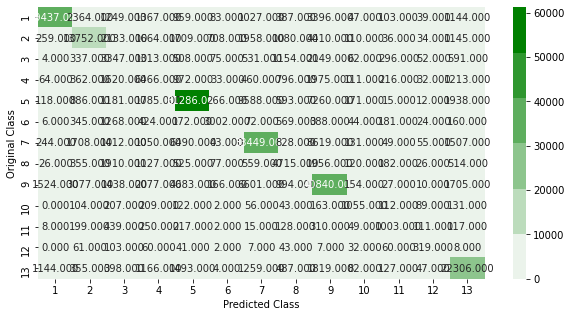

-------------------------------------------------- Precision matrix --------------------------------------------------


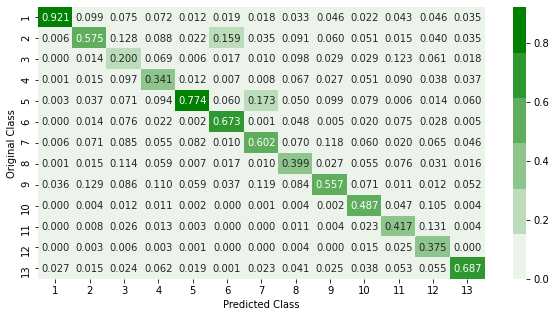

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


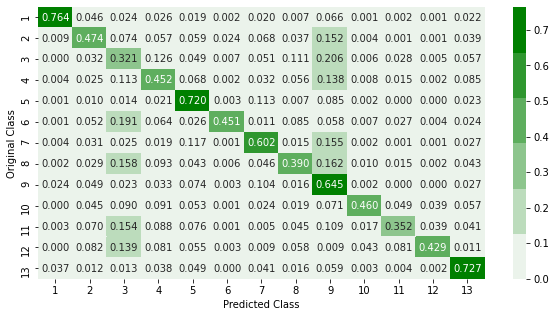

Sum of rows in Recall matrix [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
x_cfl=XGBClassifier(n_estimators=100,nthread=-1)
x_cfl.fit(X_tr,y_train)
sig_clf = CalibratedClassifierCV(x_cfl, method="sigmoid")
sig_clf.fit(X_tr, y_train)  

predict_y = sig_clf.predict_proba(X_tr)
print ('For values of best alpha = ', 100, "The train log loss is:",log_loss(y_train, predict_y))
predict_y = sig_clf.predict_proba(X_cv)
print('For values of best alpha = ',100, "The cross validation log loss is:",log_loss(y_cv, predict_y))
predict_y = sig_clf.predict_proba(X_te)
print('For values of best alpha = ', 100, "The test log loss is:",log_loss(y_test, predict_y))
plot_confusion_matrix(y_test, sig_clf.predict(X_te))

In [ ]:
for i in range(5):
  predicted_cls = sig_clf.predict(X_te[i].reshape(1, -1))
  print("Predicted Class :", predicted_cls[0])
  print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_te[i].reshape(1, -1)),4))
  print("Actual Class :", y_test.iloc[i,])
  print('*'*100)

Predicted Class : 13.0
Predicted Class Probabilities: [[2.520e-02 3.580e-02 3.340e-02 1.790e-02 2.910e-02 6.900e-03 2.460e-02
  1.430e-02 2.280e-02 5.400e-03 3.100e-03 6.000e-04 7.809e-01]]
Actual Class : 13.0
****************************************************************************************************
Predicted Class : 7.0
Predicted Class Probabilities: [[0.0486 0.1321 0.0102 0.0121 0.1324 0.0085 0.3974 0.0111 0.2222 0.0042
  0.0039 0.0008 0.0164]]
Actual Class : 1.0
****************************************************************************************************
Predicted Class : 9.0
Predicted Class Probabilities: [[0.0254 0.2612 0.0025 0.0065 0.1404 0.0059 0.0539 0.0056 0.482  0.0027
  0.0027 0.0006 0.0104]]
Actual Class : 9.0
****************************************************************************************************
Predicted Class : 4.0
Predicted Class Probabilities: [[0.0258 0.0834 0.0398 0.5762 0.0668 0.0075 0.033  0.0401 0.1042 0.0041
  0.0036 0.0007 0.0148]]

log_loss for c =  10 is 1.9763207809735417
log_loss for c =  50 is 2.0101113597818974
log_loss for c =  100 is 2.0147695268988177
log_loss for c =  500 is 2.038847024670539


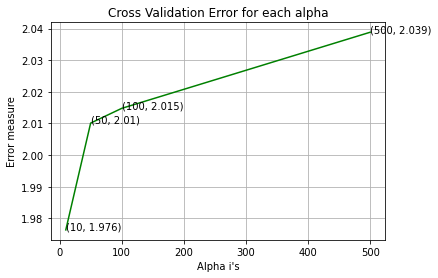

In [ ]:
#You can use any ML learner as base estimator if it accepts sample weight such as Decision Tree, Support Vector Classifier
#if None, DecisionTreeClassifier initialized with max_depth=1.
#svc=SVC(probability=True, kernel='linear')
# Create adaboost classifer object
#abc =AdaBoostClassifier(n_estimators=50, base_estimator=svc,learning_rate=1)

from sklearn.ensemble import AdaBoostClassifier

alpha=[10,50,100,500]
cv_log_error_array=[]
for i in alpha:
    x_cfl=AdaBoostClassifier(n_estimators=i)
    x_cfl.fit(X_tr,y_train)
    sig_clf = CalibratedClassifierCV(x_cfl, method="sigmoid")
    sig_clf.fit(X_tr, y_train)
    predict_y = sig_clf.predict_proba(X_cv)
    cv_log_error_array.append(log_loss(y_cv, predict_y, labels=x_cfl.classes_, eps=1e-15))

for i in range(len(cv_log_error_array)):
    print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])


best_alpha = np.argmin(cv_log_error_array)

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()



For values of best alpha =  10 The train log loss is: 1.975871319383606
For values of best alpha =  10 The cross validation log loss is: 1.976320780978695
For values of best alpha =  10 The test log loss is: 1.9753507617127244
Number of misclassified points  75.89383414190003
-------------------------------------------------- Confusion matrix --------------------------------------------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


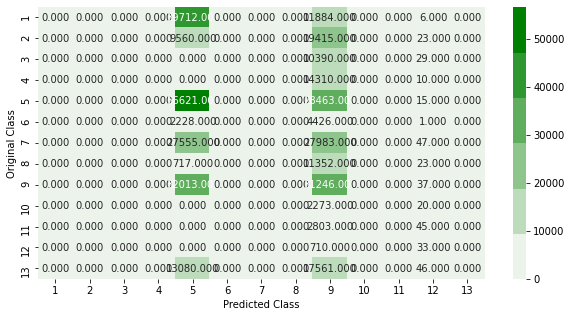

-------------------------------------------------- Precision matrix --------------------------------------------------


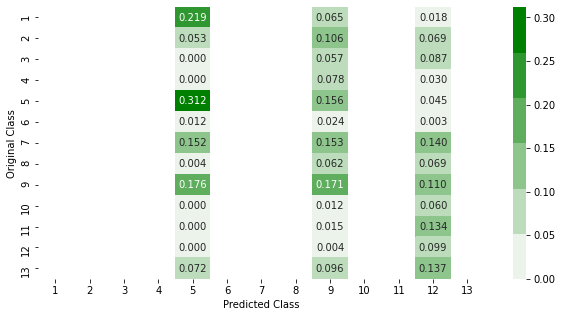

Sum of columns in precision matrix [nan nan nan nan  1. nan nan nan  1. nan nan  1. nan]
-------------------------------------------------- Recall matrix --------------------------------------------------


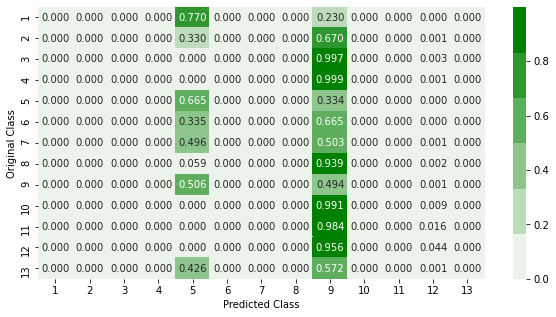

Sum of rows in Recall matrix [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
x_cfl=AdaBoostClassifier(n_estimators=10)
x_cfl.fit(X_tr,y_train)
sig_clf = CalibratedClassifierCV(x_cfl, method="sigmoid")
sig_clf.fit(X_tr, y_train)  

predict_y = sig_clf.predict_proba(X_tr)
print ('For values of best alpha = ', 10, "The train log loss is:",log_loss(y_train, predict_y))
predict_y = sig_clf.predict_proba(X_cv)
print('For values of best alpha = ',10, "The cross validation log loss is:",log_loss(y_cv, predict_y))
predict_y = sig_clf.predict_proba(X_te)
print('For values of best alpha = ', 10, "The test log loss is:",log_loss(y_test, predict_y))
plot_confusion_matrix(y_test, sig_clf.predict(X_te))

In [ ]:
for i in range(5):
  predicted_cls = sig_clf.predict(X_te[i].reshape(1, -1))
  print("Predicted Class :", predicted_cls[0])
  print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_te[i].reshape(1, -1)),4))
  print("Actual Class :", y_test.iloc[i,])
  print('*'*100)

Predicted Class : 5.0
Predicted Class Probabilities: [[2.050e-01 5.290e-02 3.000e-04 3.000e-04 3.218e-01 1.210e-02 1.540e-01
  4.300e-03 1.773e-01 0.000e+00 0.000e+00 0.000e+00 7.190e-02]]
Actual Class : 7.0
****************************************************************************************************
Predicted Class : 9.0
Predicted Class Probabilities: [[0.0434 0.111  0.065  0.0843 0.1685 0.0246 0.1586 0.0572 0.1785 0.0015
  0.0077 0.0005 0.0991]]
Actual Class : 9.0
****************************************************************************************************
Predicted Class : 5.0
Predicted Class Probabilities: [[2.050e-01 5.290e-02 3.000e-04 3.000e-04 3.218e-01 1.210e-02 1.540e-01
  4.300e-03 1.773e-01 0.000e+00 0.000e+00 0.000e+00 7.190e-02]]
Actual Class : 7.0
****************************************************************************************************
Predicted Class : 5.0
Predicted Class Probabilities: [[2.050e-01 5.290e-02 3.000e-04 3.000e-04 3.218e-01 1.210e-

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


Data Set before Sampling
Class=1, n=165126 (9.057%)
Class=13, n=98198 (5.386%)
Class=5, n=272316 (14.936%)
Class=9, n=202546 (11.109%)
Class=10, n=7338 (0.402%)
Class=7, n=177874 (9.756%)
Class=4, n=45824 (2.513%)
Class=2, n=92794 (5.090%)
Class=3, n=33339 (1.829%)
Class=8, n=38693 (2.122%)
Class=6, n=21296 (1.168%)
Class=11, n=9114 (0.500%)
Class=12, n=2378 (0.130%)


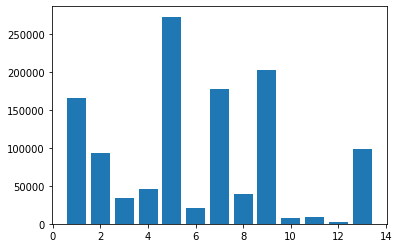

Data Set after Sampling using SMOTE(IMBlearn)
Class=1, n=272316 (14.936%)
Class=13, n=272316 (14.936%)
Class=5, n=272316 (14.936%)
Class=9, n=272316 (14.936%)
Class=10, n=272316 (14.936%)
Class=7, n=272316 (14.936%)
Class=4, n=272316 (14.936%)
Class=2, n=272316 (14.936%)
Class=3, n=272316 (14.936%)
Class=8, n=272316 (14.936%)
Class=6, n=272316 (14.936%)
Class=11, n=272316 (14.936%)
Class=12, n=272316 (14.936%)


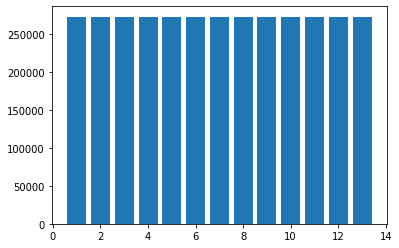

In [ ]:
from imblearn.over_sampling import SMOTE

from collections import Counter
from matplotlib import pyplot
import warnings
warnings.filterwarnings("ignore")
print('Data Set before Sampling')
counter = Counter(y_train)
for k,v in counter.items():
	per = v / len(y) * 100
	print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
pyplot.bar(counter.keys(), counter.values())
pyplot.show()

sm = SMOTE(random_state=27)
X_tr, y_train = sm.fit_sample(X_tr, y_train)

print('Data Set after Sampling using SMOTE(IMBlearn)')
counter = Counter(y_train)
for k,v in counter.items():
	per = v / len(y) * 100
	print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
pyplot.bar(counter.keys(), counter.values())
pyplot.show()

log_loss for c =  10 is 2.3409784168995387
log_loss for c =  50 is 2.350092681577968
log_loss for c =  100 is 2.3543406131149114
log_loss for c =  500 is 2.3731211341907215


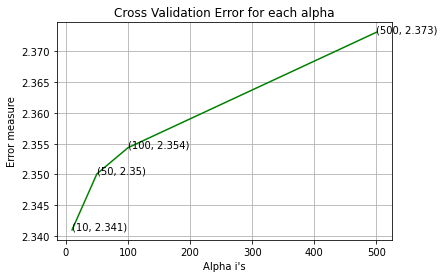

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

alpha=[10,50,100,500]
cv_log_error_array=[]
for i in alpha:
    x_cfl=AdaBoostClassifier(n_estimators=i)
    x_cfl.fit(X_tr,y_train)
    sig_clf = CalibratedClassifierCV(x_cfl, method="sigmoid")
    sig_clf.fit(X_tr, y_train)
    predict_y = sig_clf.predict_proba(X_cv)
    cv_log_error_array.append(log_loss(y_cv, predict_y, labels=x_cfl.classes_, eps=1e-15))

for i in range(len(cv_log_error_array)):
    print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])


best_alpha = np.argmin(cv_log_error_array)

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()



In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense,Input,concatenate,Dropout,BatchNormalization
from tensorflow.keras.models import Model
from keras.regularizers import l2

In [ ]:
y_train=tf.keras.utils.to_categorical(y_train)
y_cv=tf.keras.utils.to_categorical(y_cv)

In [ ]:
tf.keras.backend.clear_session()
model = tf.keras.Sequential()
model.add(Dense(512, input_shape=(10,),activation='relu',kernel_initializer=tf.keras.initializers.HeNormal(),kernel_regularizer=tf.keras.regularizers.L2(0.001)))
model.add(Dropout(0.2))
model.add(Dense(256,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal(),kernel_regularizer=tf.keras.regularizers.L2(0.001)))
model.add(Dropout(0.2))
model.add(Dense(128,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal(),kernel_regularizer=tf.keras.regularizers.L2(0.001)))
model.add(Dropout(0.2))
model.add(Dense(64,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal(),kernel_regularizer=tf.keras.regularizers.L2(0.001)))
model.add(Dense(32,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal(),kernel_regularizer=tf.keras.regularizers.L2(0.001)))
model.add(Dense(14, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 512)               5632      
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 64)                8

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=['accuracy'])

model.fit(X_tr, y_train, epochs=50, validation_data=(X_cv,y_cv), verbose=1, batch_size=512,shuffle=True)


Epoch 1/50
2279/2279 [==============================] - 42s 18ms/step - loss: 4.0842 - accuracy: 0.1966 - val_loss: 3.2154 - val_accuracy: 0.2334
Epoch 2/50
2279/2279 [==============================] - 42s 18ms/step - loss: 2.9590 - accuracy: 0.2402 - val_loss: 2.7298 - val_accuracy: 0.2587
Epoch 3/50
2279/2279 [==============================] - 41s 18ms/step - loss: 2.5560 - accuracy: 0.2559 - val_loss: 2.3990 - val_accuracy: 0.2613
Epoch 4/50
2279/2279 [==============================] - 41s 18ms/step - loss: 2.2983 - accuracy: 0.2605 - val_loss: 2.2033 - val_accuracy: 0.2643
Epoch 5/50
2279/2279 [==============================] - 41s 18ms/step - loss: 2.1553 - accuracy: 0.2628 - val_loss: 2.1127 - val_accuracy: 0.2606
Epoch 6/50
2279/2279 [==============================] - 41s 18ms/step - loss: 2.0929 - accuracy: 0.2651 - val_loss: 2.0698 - val_accuracy: 0.2745
Epoch 7/50
2279/2279 [==============================] - 41s 18ms/step - loss: 2.0667 - accuracy: 0.2774 - val_loss: 2.0457 -

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df, y,stratify=y,train_size=0.10)

from sklearn.feature_extraction.text import CountVectorizer
from sklearn import preprocessing
classifier=preprocessing.LabelEncoder()


classifier.fit(X_train["STATE"].values)
X_train_state_onehot = classifier.transform(X_train['STATE'].values).reshape(-1,1)
X_test_state_onehot = classifier.transform(X_test['STATE'].values).reshape(-1,1)

#print(classifier.get_feature_names())
print(classifier.classes_)
print("*"*100)



classifier.fit(X_train["DAY_OF_WEEK"].values)
X_train_DOW_onehot = classifier.transform(X_train['DAY_OF_WEEK'].values).reshape(-1,1)
X_test_DOW_onehot = classifier.transform(X_test['DAY_OF_WEEK'].values).reshape(-1,1)

#print(classifier.get_feature_names())
print(classifier.classes_)
print("*"*100)



# for numerical features 
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train[['LATITUDE','LONGITUDE','DISCOVERY_DATE','DISCOVERY_DOY','FIRE_SIZE','FIRE_YEAR','MONTH','FirePerMonth']].values)
X_train_norm = normalizer.transform(X_train[['LATITUDE',	'LONGITUDE','DISCOVERY_DATE','DISCOVERY_DOY','FIRE_SIZE','FIRE_YEAR','MONTH','FirePerMonth']].values)
normalizer.fit(X_test[['LATITUDE','LONGITUDE','DISCOVERY_DATE','DISCOVERY_DOY','FIRE_SIZE','FIRE_YEAR','MONTH','FirePerMonth']].values)
X_test_norm = normalizer.transform(X_test[['LATITUDE',	'LONGITUDE','DISCOVERY_DATE','DISCOVERY_DOY','FIRE_SIZE','FIRE_YEAR','MONTH','FirePerMonth']].values)


from scipy.sparse import vstack
X_tr = np.hstack((X_train_state_onehot,X_train_DOW_onehot,X_train_norm))
X_te = np.hstack((X_test_state_onehot,X_test_DOW_onehot,X_test_norm))


['AK' 'AL' 'AR' 'AZ' 'CA' 'CO' 'CT' 'DC' 'DE' 'FL' 'GA' 'IA' 'ID' 'IL'
 'IN' 'KS' 'KY' 'LA' 'MA' 'MD' 'ME' 'MI' 'MN' 'MO' 'MS' 'MT' 'NC' 'ND'
 'NE' 'NH' 'NJ' 'NM' 'NV' 'NY' 'OH' 'OK' 'OR' 'PA' 'PR' 'RI' 'SC' 'SD'
 'TN' 'TX' 'UT' 'VA' 'VT' 'WA' 'WI' 'WV' 'WY']
****************************************************************************************************
['Friday' 'Monday' 'Saturday' 'Sunday' 'Thursday' 'Tuesday' 'Wednesday']
****************************************************************************************************


In [ ]:
X_te.shape,X_tr.shape

((1640864, 10), (182318, 10))

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB 
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from mlxtend.classifier import StackingClassifier
from sklearn.metrics import log_loss, make_scorer
from sklearn.svm import SVC
import warnings
warnings.filterwarnings("ignore")
# Initializing models

clf1 = KNeighborsClassifier()
clf2 = RandomForestClassifier(random_state=1)
clf3 = GaussianNB()
clf4 = LogisticRegression(penalty='l2')
clf5 = SVC(kernel='rbf')
basemodel=[clf1, clf2, clf3,clf4,clf5]

sclf = StackingClassifier(classifiers=basemodel,meta_classifier=clf4)

params = {'kneighborsclassifier__n_neighbors': [3,5],
            'randomforestclassifier__n_estimators': [50,100],
            'meta_classifier__C': [0.001,0.1]}

LogLoss = make_scorer(log_loss, greater_is_better=False, needs_proba=True)
grid = GridSearchCV(estimator=sclf,param_grid=params,cv=2,scoring=LogLoss)
grid.fit(X_tr, y_train)

cv_keys = ('mean_test_score', 'std_test_score', 'params')

for r, _ in enumerate(grid.cv_results_['mean_test_score']):
    print("%0.3f +/- %0.2f %r"
          % (grid.cv_results_[cv_keys[0]][r],
            grid.cv_results_[cv_keys[1]][r] / 2.0,
            grid.cv_results_[cv_keys[2]][r]))

print('Best parameters: %s' % grid.best_params_)
print('Logloss: %.2f' % grid.best_score_)

In [1]:
from prettytable import PrettyTable

myTable = PrettyTable(["Model name ", "Log loss(Approx)-Cross validation"])
myTable.add_row(['Random Model', '2.6'])
myTable.add_row(['KNN(Best Alpha=3)', '0.146'])
myTable.add_row(['RandomForestClassifier(Best Alpha=50)', '0.045'])
myTable.add_row(['XGBClassifier(Best Alpha=500)', '0.53'])
myTable.add_row(['AdaboostClassifier(Best Alpha=10)(Imbalanced)', '1.98'])
myTable.add_row(['AdaboostClassifier(Best Alpha=10)(Balanced)', '2.34'])
myTable.add_row(['NN', '1.95'])
print(myTable)

+-----------------------------------------------+-----------------------------------+
|                  Model name                   | Log loss(Approx)-Cross validation |
+-----------------------------------------------+-----------------------------------+
|                  Random Model                 |                2.6                |
|               KNN(Best Alpha=3)               |               0.146               |
|     RandomForestClassifier(Best Alpha=50)     |               0.045               |
|         XGBClassifier(Best Alpha=500)         |                0.53               |
| AdaboostClassifier(Best Alpha=10)(Imbalanced) |                1.98               |
|  AdaboostClassifier(Best Alpha=10)(Balanced)  |                2.34               |
|                       NN                      |                1.95               |
+-----------------------------------------------+-----------------------------------+


#Model Comparison

After training the models on such a large data we have faced challeges of RAM which is very limited for us Nevertheless I am able to train many of the models and above is summary of them with log loss.Also to add here, we would have trained/tunned the bagging model(Random forest) for some more estimator. Among all of the models Random forest has performed very well in classifiying the data which is imbalanced.

KNN worked very well because it works on nearest neighbour technique.
We have also checked the models like logistic regression and SVM both on balanced and imbalanced data but they are slightly better than Random model.
For up sampling we have used the IMBLearn SMOTE technique which again increased the data but still we didn’t found any much improvement on both the models.


# EDA Analysis

•	We are dealing with imbalance data set.

•	We have extracted only 11 features to classify the class labels.

•	Almost all day of week has seen the wildfire however March, April, July and August are the month which have large wildfires.

•	 The most common causes of wildfire are debris burning, Miscellaneous, Arson (the criminal act of deliberately setting fire to property) and natural lighting.

•	After the EDA we can say that states like CA, GA and TX are largely affected and need more man power or technology to deal with wild fires.

•	There is no trend in the occurring of wild fires throughout the year so we can’t really predict the number of wildfires for the coming specific years.

•	We have also removed outliers from Latitude and longitude column using Box plot technique.

•	Numbers of wild fires caused by lighting are  covering large area if occurred other than miscellaneous so we have to be well prepared for it.

•	We have performed various correlation test (Pearson, chi square test) and found there is very less correlation between the features and target variable as P value is very low.
